<a href="https://www.kaggle.com/code/vainero/boston-house-price-ensemble-methods?scriptVersionId=95120677" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## Import Libraries


In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from numpy import arange
import seaborn as sns
import pandas_profiling as pp
%matplotlib inline

from pandas import read_csv
from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split as split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error 

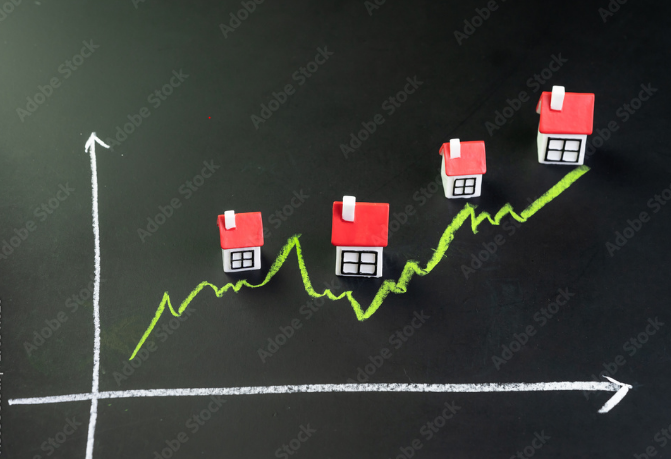

Photo Credit: https://stock.adobe.com/il/search?load_type=search&native_visual_search=&similar_content_id=&is_recent_search=&search_type=autosuggest&k=house+price&acp=0&aco=house+price&asset_id=276541026

**Content**

Each record in the database describes a Boston suburb or town. The data was drawn from the Boston Standard Metropolitan Statistical Area (SMSA) in 1970. The attributes are deﬁned as follows (taken from the UCI Machine Learning Repository1): 

**CRIM**: per capita crime rate by town

**ZN**: proportion of residential land zoned for lots over 25,000 sq.ft.

**INDUS**: proportion of non-retail business acres per town

**CHAS**: Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)

**NOX**: nitric oxides concentration (parts per 10 million

**RM**: average number of rooms per dwelling

**AGE**: proportion of owner-occupied units built prior to 1940

**DIS**: weighted distances to ﬁve Boston employment centers

**RAD**: index of accessibility to radial highways

**TAX**: full-value property-tax rate per $10,000

**PTRATIO**: pupil-teacher ratio by town 

**B**: 1000(Bk−0.63)2 where Bk is the proportion of blacks by town 

**LSTAT**: % lower status of the population

**MEDV**: Median value of owner-occupied homes in $1,000. 

## Load Data

In [2]:
column_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 
                'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
boston = read_csv('../input/boston-house-prices/housing.csv', header=None, 
                  delimiter=r"\s+", names=column_names)
boston.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


## Analyze Data

In [3]:
# Pandas Profiling Report
report = pp.ProfileReport(boston)
display(report)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Descriptive Statistics

In [4]:
print(boston.shape) # The data has 506 rows and 14 columns

(506, 14)


In [5]:
boston.info() 

# The data has 506 entries, and 14 features
# Most of the features of the float type

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [6]:
# Summarize the description of each attribute
boston.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


## Visualization

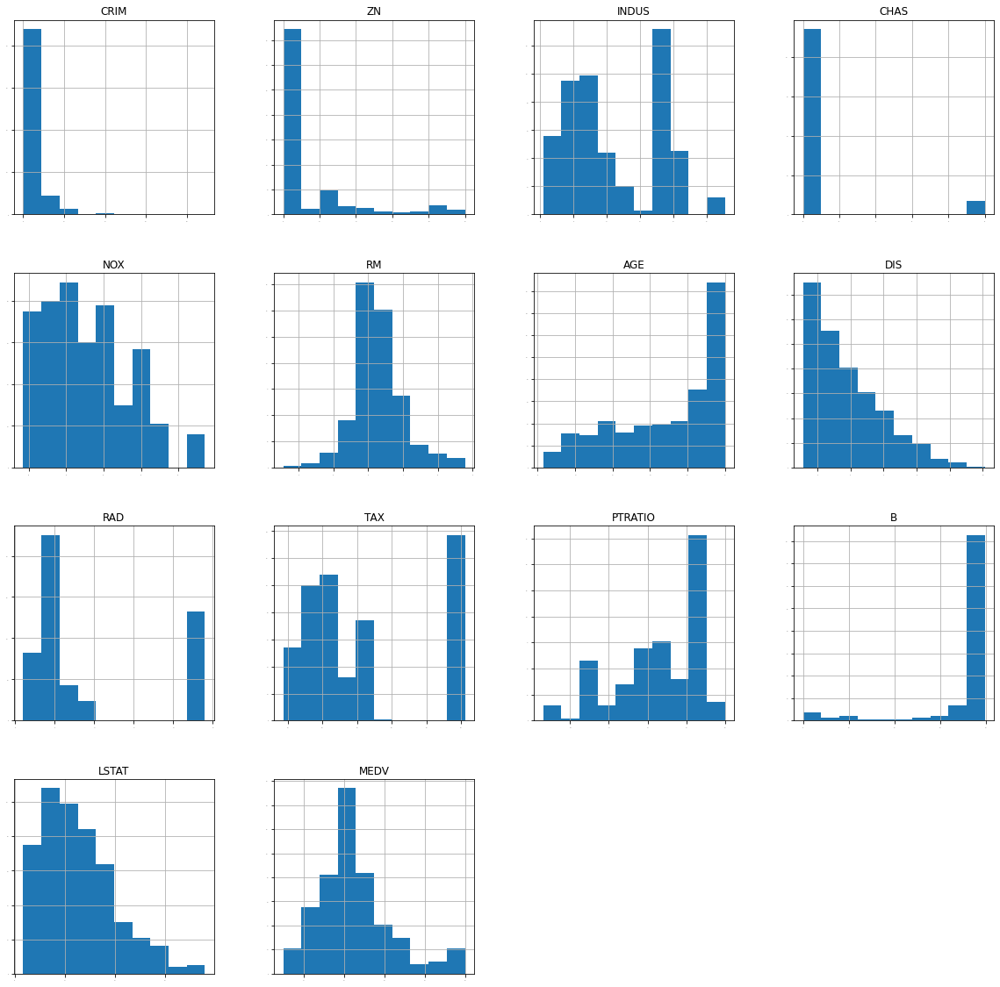

In [7]:
# The histogram of each attribute
boston.hist(sharex=False, sharey=False, xlabelsize=1, 
            ylabelsize=1, figsize = (20,20))
           
plt.show() 

- Some attributes may have an exponential distribution, such as CRIM, ZN,AGE and B.
- We can see that others may have a bimodal distribution such as RAD and TAX

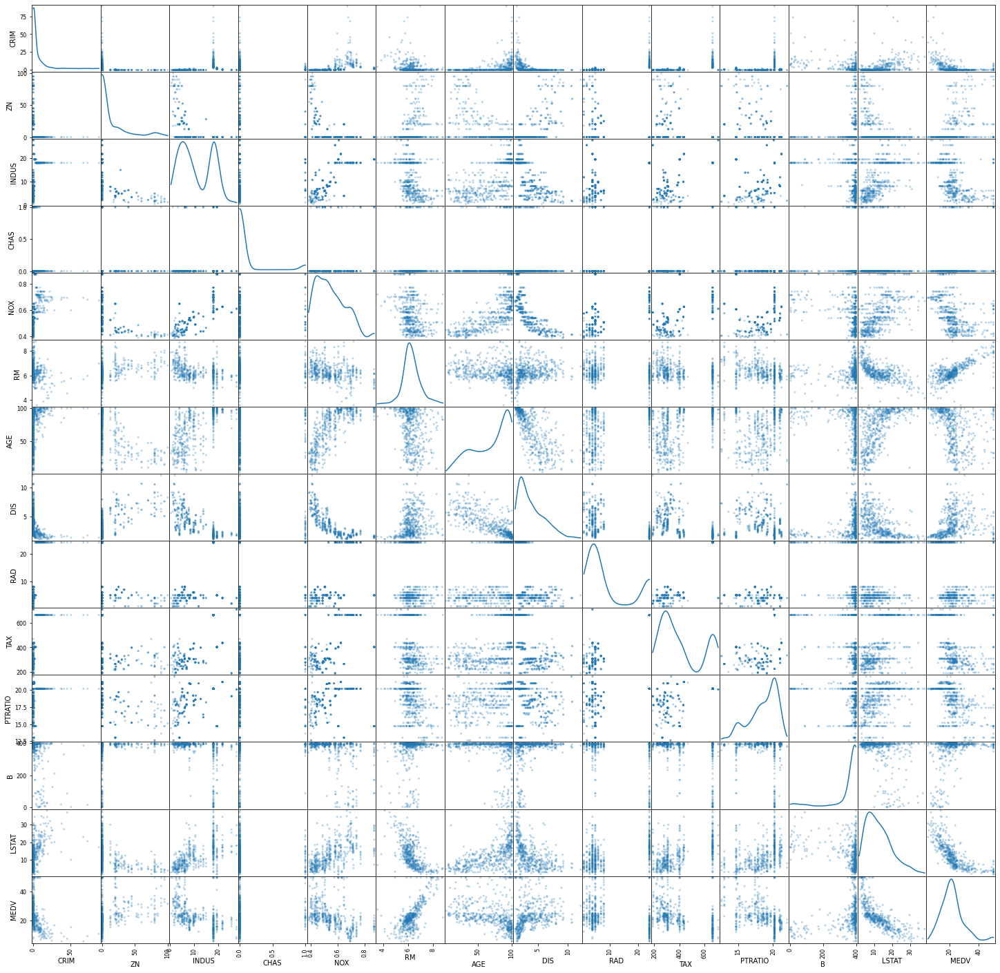

In [8]:
# The visualization of the interactions between variables: scatter plot matrix
scatter_matrix(boston,  alpha = 0.3, figsize = (25,25), diagonal = 'kde') 
plt.show() 
# Some of the higher correlated attributes do show good structure in their relationship

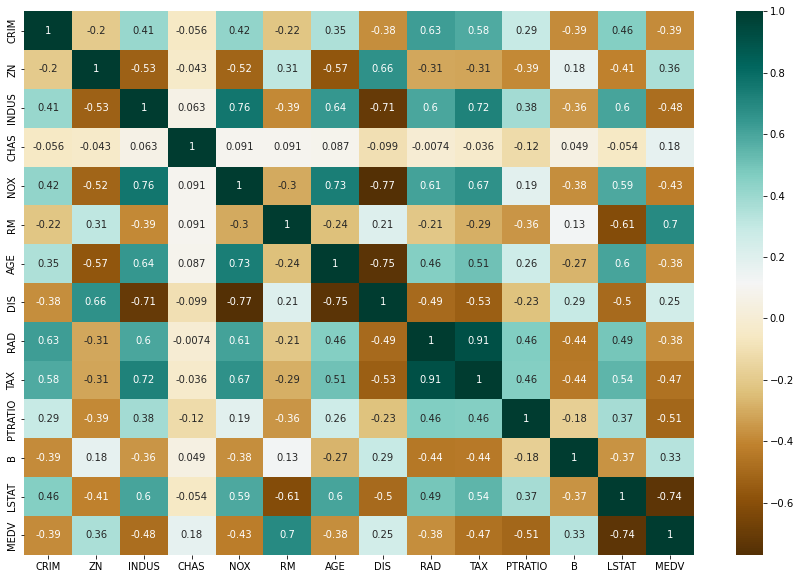

In [9]:
# Correlation matrix
plt.figure(figsize = (15,10))
sns.heatmap(boston.corr(), annot=True, cmap ='BrBG');

## Split Data

In [10]:
# Split-out validation dataset
array = boston.values
X = array[:,0:13]
Y = array[:,13]

X_train, X_val, Y_train, Y_val = split(X, Y, test_size=0.3, random_state=1313)

##  Evaluate Algorithms

In [11]:
# Test options and evaluation metric
num_folds = 10
scoring = 'neg_mean_squared_error' 

 **Linear Algorithms**:  

       Linear Regression (LR)
  
       Lasso Regression (LASSO) 
  
       ElasticNet (EN)

 **Nonlinear Algorithms**: 

       Classification and Regression Trees (CART)
  
       Support Vector Regression (SVR) 
      
       k-Nearest Neighbors (KNN)

In [12]:
# Spot-Check Algorithms
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

In [13]:
# Evaluate each model in turn
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
        
    print('{}: MSE = {}, std = {}'.format(name, cv_results.mean(), 
                                          cv_results.std()))


LR: MSE = -27.36131140858645, std = 9.93509006275068
LASSO: MSE = -32.98151412888643, std = 12.250117565268328
EN: MSE = -32.12114378451524, std = 11.82933808085179
KNN: MSE = -47.93050758730159, std = 23.644273855543908
CART: MSE = -31.48873968253968, std = 28.780472776507068
SVR: MSE = -74.64354750628924, std = 38.6337220320373


The distribution of scores across all cross-validation folds

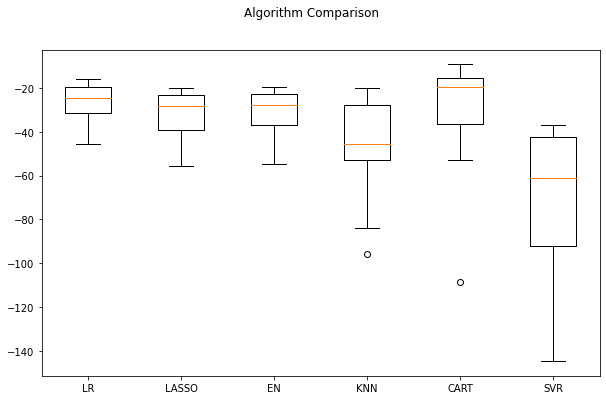

In [14]:
# Compare Algorithms
fig = plt.figure(figsize=(10,6))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()  

## Evaluate Algorithms: Standardization

In [15]:
# Standardize the dataset
pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR',
LinearRegression())])))
pipelines.append(('ScaledLASSO', Pipeline([('Scaler', StandardScaler()),('LASSO',
Lasso())])))
pipelines.append(('ScaledEN', Pipeline([('Scaler', StandardScaler()),('EN',
ElasticNet())])))
pipelines.append(('ScaledKNN', Pipeline([('Scaler', StandardScaler()),('KNN',
KNeighborsRegressor())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART',
DecisionTreeRegressor())])))
pipelines.append(('ScaledSVR', Pipeline([('Scaler', StandardScaler()),('SVR', SVR())])))
results = []
names = []
for name, model in pipelines:
    kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('{}: MSE = {}, std = {}'.format(name, cv_results.mean(), 
                                          cv_results.std())) 
# Scaling did have an effect on KNN, driving the error lower than the other models

ScaledLR: MSE = -27.3613114085865, std = 9.935090062750573
ScaledLASSO: MSE = -33.21344983124289, std = 15.750658658890748
ScaledEN: MSE = -35.08906059683063, std = 19.078055572650076
ScaledKNN: MSE = -24.06457028571429, std = 12.308420028084821
ScaledCART: MSE = -32.407738888888886, std = 28.65684274962417
ScaledSVR: MSE = -37.21531702409951, std = 25.876929112205055


The distribution of the scores across the cross-validation folds

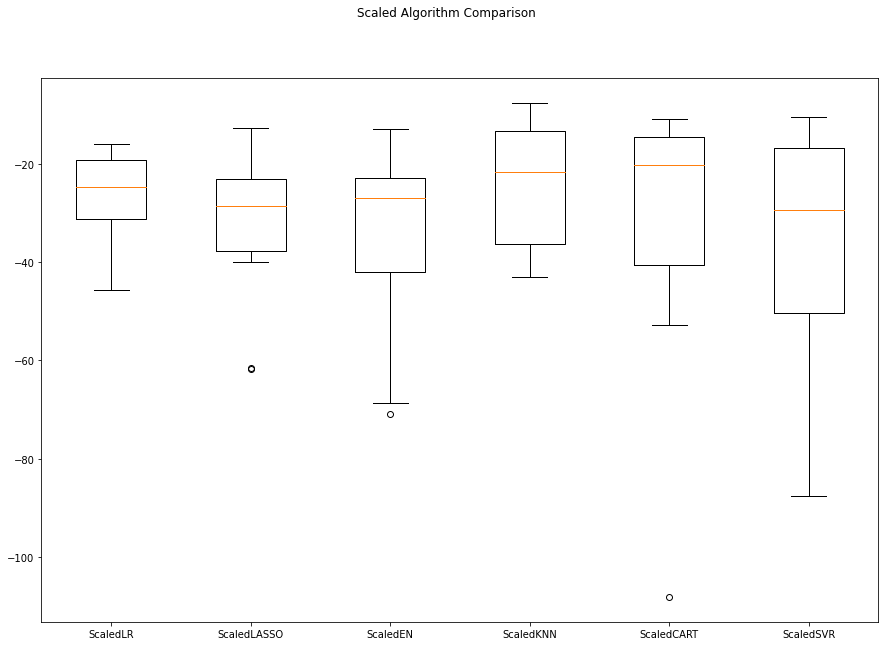

In [16]:
# Compare Algorithms
fig = plt.figure(figsize = (15,10))
fig.suptitle('Scaled Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show() 
# KNN has both a tight distribution of error and has the lowest score

## Improve Results With Tuning

In [17]:
# KNN Algorithm tuning
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
k_values = np.array([1,3,5,7,9,11,13,15,17,19,21])
param_grid = dict(n_neighbors=k_values)
model = KNeighborsRegressor()
kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, 
                    scoring=scoring, cv=kfold)
grid_result = grid.fit(rescaledX, Y_train)
print("Best: %f using %s" % (grid_result.best_score_, 
                             grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
# The best for k (n_neighbors) is 3 providing a mean squared error of -20.564384, the best so far

Best: -20.564384 using {'n_neighbors': 3}
-26.864780 (15.510805) with: {'n_neighbors': 1}
-20.564384 (12.561021) with: {'n_neighbors': 3}
-24.056696 (12.369413) with: {'n_neighbors': 5}
-24.847278 (12.706571) with: {'n_neighbors': 7}
-24.669319 (13.116020) with: {'n_neighbors': 9}
-25.654495 (14.316809) with: {'n_neighbors': 11}
-25.827475 (15.593796) with: {'n_neighbors': 13}
-27.376040 (17.074584) with: {'n_neighbors': 15}
-28.399404 (17.972374) with: {'n_neighbors': 17}
-29.531670 (19.130921) with: {'n_neighbors': 19}
-29.976996 (19.235626) with: {'n_neighbors': 21}


##  Ensemble Methods

 **Boosting Methods**:

        AdaBoost (AB)
        Gradient Boosting (GBM)

 **Bagging Methods**: 

        Random Forests (RF)
        Extra Trees (ET)

In [18]:
# Ensembles
ensembles = []
ensembles.append(('ScaledAB', Pipeline([('Scaler', StandardScaler()),('AB',
AdaBoostRegressor())])))
ensembles.append(('ScaledGBM', Pipeline([('Scaler', StandardScaler()),('GBM',
GradientBoostingRegressor())])))
ensembles.append(('ScaledRF', Pipeline([('Scaler', StandardScaler()),('RF',
RandomForestRegressor(n_estimators=10))])))
ensembles.append(('ScaledET', Pipeline([('Scaler', StandardScaler()),('ET',
ExtraTreesRegressor(n_estimators=10))])))
results = []
names = []
for name, model in ensembles:
    kfold = KFold(n_splits=num_folds, random_state=1313, 
                  shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), 
                           cv_results.std())
    print(msg) 
    # The better scores than our previous linear and nonlinear algorithms

ScaledAB: -16.670847 (9.427829)
ScaledGBM: -12.038112 (6.926914)
ScaledRF: -14.234711 (5.906932)
ScaledET: -13.113322 (4.367761)


We can also plot the distribution of scores across the cross-validation folds

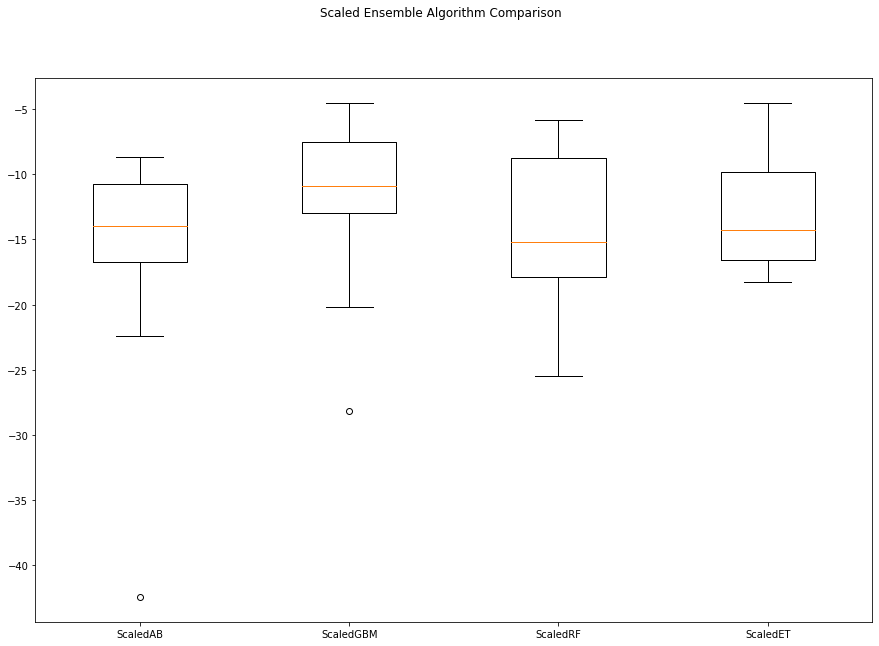

In [19]:
# Compare Algorithms
fig = plt.figure(figsize = (15,10))
fig.suptitle('Scaled Ensemble Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show() 


## Tune Ensemble Methods

In [20]:
# Tune scaled GBM
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
param_grid = {'n_estimators':[100,200,250,300,400]} 

model = GradientBoostingRegressor(random_state=1313, learning_rate = 0.1,
                                  max_depth = 4, min_samples_leaf = 3)
kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, 
                    scoring=scoring, cv=kfold)
grid_result = grid.fit(rescaledX, Y_train)



print("Best: %f using %s" % (grid_result.best_score_, 
                             grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    

Best: -11.458447 using {'n_estimators': 250}
-11.546070 (5.655048) with: {'n_estimators': 100}
-11.469480 (5.795134) with: {'n_estimators': 200}
-11.458447 (5.816996) with: {'n_estimators': 250}
-11.462882 (5.839673) with: {'n_estimators': 300}
-11.499454 (5.831208) with: {'n_estimators': 400}


In [21]:
# Tune scaled ET
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
param_grid = dict(n_estimators=np.array([100,200,250,300,400]))
model = ExtraTreesRegressor(random_state=1313)

kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, 
                    scoring=scoring, cv=kfold)
grid_result = grid.fit(rescaledX, Y_train)

print("Best: %f using %s" % (grid_result.best_score_, 
                             grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: -11.570732 using {'n_estimators': 250}
-11.629639 (4.714891) with: {'n_estimators': 100}
-11.686285 (4.776718) with: {'n_estimators': 200}
-11.570732 (4.694601) with: {'n_estimators': 250}
-11.777997 (4.829233) with: {'n_estimators': 300}
-11.771581 (4.796872) with: {'n_estimators': 400}


## Final Model

Now we can scale the inputs for the validation dataset and generate predictions

In [22]:
# Prepare the GBM model
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
model = GradientBoostingRegressor(random_state=1313, n_estimators=250, 
                                  learning_rate=0.1, max_depth = 4, 
                                  min_samples_leaf = 3)
model.fit(rescaledX, Y_train)

# Transform the validation dataset
rescaledValidationX = scaler.transform(X_val)
predictions = model.predict(rescaledValidationX)
print('GBM model: MSE = {}'.format(mean_squared_error(Y_val, predictions)))

GBM model: MSE = 6.437299861139799


In [23]:
# Prepare the ET model
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
model = ExtraTreesRegressor(random_state=1313, n_estimators=250)
model.fit(rescaledX, Y_train)

# Transform the validation dataset
rescaledValidationX = scaler.transform(X_val)
predictions = model.predict(rescaledValidationX)
print('ET model: MSE = {}'.format(mean_squared_error(Y_val, predictions))) 

ET model: MSE = 7.614296836842118


### 👍 If you find this notebook useful, please support with an upvote 👍